# (Case Study 5)Bird Migration

## 4.2.1: Introduction to GPS Tracking of Birds

In [16]:
import pandas as pd

birddata = pd.read_csv('bird_tracking.csv')

birddata.head()

,Unnamed: 0,altitude,date_time,device_info_serial,direction,latitude,longitude,speed_2d,bird_name
0,0,71,2013-08-15 00:18:08+00,851,-150.469753,49.419860,2.120733,0.150000,Eric
1,1,68,2013-08-15 00:48:07+00,851,-136.151141,49.419880,2.120746,2.438360,Eric
2,2,68,2013-08-15 01:17:58+00,851,160.797477,49.420310,2.120885,0.596657,Eric
3,3,73,2013-08-15 01:47:51+00,851,32.769360,49.420359,2.120859,0.310161,Eric
4,4,69,2013-08-15 02:17:42+00,851,45.191230,49.420331,2.120887,0.193132,Eric


## 4.2.2: Simple Data Visualizations

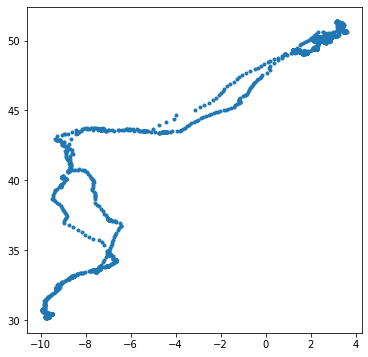

In [17]:
import matplotlib.pyplot as plt 
import numpy as np 

ix = birddata.bird_name == "Eric"

x, y = (birddata.longitude[ix], birddata.latitude[ix])

plt.figure(figsize=(6,6))

plt.plot(x, y, ".")

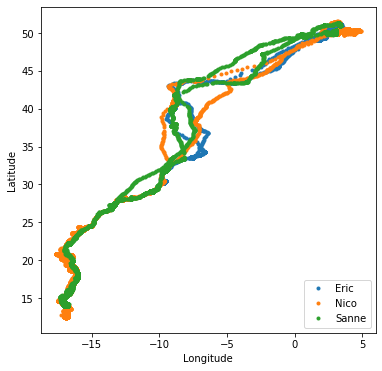

In [18]:
bird_names = pd.unique(birddata.bird_name)

plt.figure(figsize=(6,6))
for bird_name in bird_names:
    ix = birddata.bird_name == bird_name
    x, y = (birddata.longitude[ix], birddata.latitude[ix])
    plt.plot(x, y, ".", label = bird_name)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc="lower right")
plt.savefig("3traj.pdf")

## 4.2.3: Examining Flight Speed

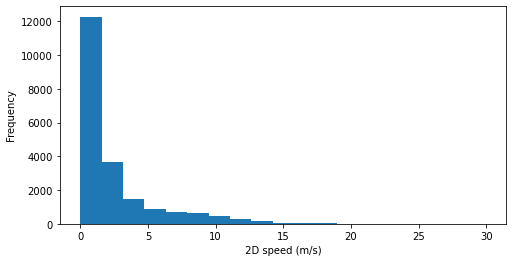

In [19]:
speed = birddata.speed_2d[ix]
  
plt.figure(figsize = (8,4))
ind = np.isnan(speed)
plt.hist(speed[~ind], bins = np.linspace(0,30,20))
plt.xlabel(" 2D speed (m/s) ")
plt.ylabel(" Frequency ")
plt.show()

## 4.2.4: Using Datetime

In [20]:
birddata.columns

birddata.date_time[:10]

0    2013-08-15 00:18:08+00
1    2013-08-15 00:48:07+00
2    2013-08-15 01:17:58+00
3    2013-08-15 01:47:51+00
4    2013-08-15 02:17:42+00
5    2013-08-15 02:47:38+00
6    2013-08-15 03:02:33+00
7    2013-08-15 03:17:27+00
8    2013-08-15 03:32:35+00
9    2013-08-15 03:47:48+00
Name: date_time, dtype: object

In [21]:
import datetime as dt  

time_1 = dt.datetime.today()

In [22]:
# time_1 = dt.datetime.today()

time_2 = dt.datetime.today()

time_2 - time_1

datetime.timedelta(microseconds=31913)

In [23]:
date_str = birddata.date_time[0]

type(date_str)

date_str

'2013-08-15 00:18:08+00'

In [24]:
dt.datetime.strptime(date_str[:-3], "%Y-%m-%d %H:%M:%S")

datetime.datetime(2013, 8, 15, 0, 18, 8)

In [25]:
# dt.datetime.strptime(date_str[:-3], "%Y-%m-%d %H:%M:%S")

timestamps=[]
for k in range((len(birddata))):
    timestamps.append(dt.datetime.strptime(birddata.date_time.iloc[k][:-3], "%Y-%m-%d %H:%M:%S"))
timestamps[:10]

[datetime.datetime(2013, 8, 15, 0, 18, 8),
 datetime.datetime(2013, 8, 15, 0, 48, 7),
 datetime.datetime(2013, 8, 15, 1, 17, 58),
 datetime.datetime(2013, 8, 15, 1, 47, 51),
 datetime.datetime(2013, 8, 15, 2, 17, 42),
 datetime.datetime(2013, 8, 15, 2, 47, 38),
 datetime.datetime(2013, 8, 15, 3, 2, 33),
 datetime.datetime(2013, 8, 15, 3, 17, 27),
 datetime.datetime(2013, 8, 15, 3, 32, 35),
 datetime.datetime(2013, 8, 15, 3, 47, 48)]

In [26]:
birddata['timestamps'] = pd.Series(timestamps, index=birddata.index)

birddata.head()


,Unnamed: 0,altitude,date_time,device_info_serial,direction,latitude,longitude,speed_2d,bird_name,timestamps
0,0,71,2013-08-15 00:18:08+00,851,-150.469753,49.419860,2.120733,0.150000,Eric,2013-08-15 00:18:08
1,1,68,2013-08-15 00:48:07+00,851,-136.151141,49.419880,2.120746,2.438360,Eric,2013-08-15 00:48:07
2,2,68,2013-08-15 01:17:58+00,851,160.797477,49.420310,2.120885,0.596657,Eric,2013-08-15 01:17:58
3,3,73,2013-08-15 01:47:51+00,851,32.769360,49.420359,2.120859,0.310161,Eric,2013-08-15 01:47:51
4,4,69,2013-08-15 02:17:42+00,851,45.191230,49.420331,2.120887,0.193132,Eric,2013-08-15 02:17:42


In [27]:
times = birddata.timestamps[birddata.bird_name=="Eric"]
elapsed_time = [time-times[0] for time in times]

elapsed_time[:10]

[Timedelta('0 days 00:00:00'),
 Timedelta('0 days 00:29:59'),
 Timedelta('0 days 00:59:50'),
 Timedelta('0 days 01:29:43'),
 Timedelta('0 days 01:59:34'),
 Timedelta('0 days 02:29:30'),
 Timedelta('0 days 02:44:25'),
 Timedelta('0 days 02:59:19'),
 Timedelta('0 days 03:14:27'),
 Timedelta('0 days 03:29:40')]

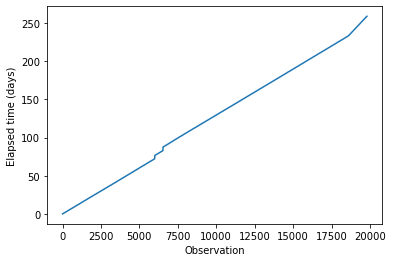

In [28]:
plt.plot(np.array(elapsed_time) / dt.timedelta(days=1))
plt.xlabel("Observation")
plt.ylabel("Elapsed time (days)")
plt.savefig("Time_graph")

## 4.2.5: Calculating Daily Mean Speed

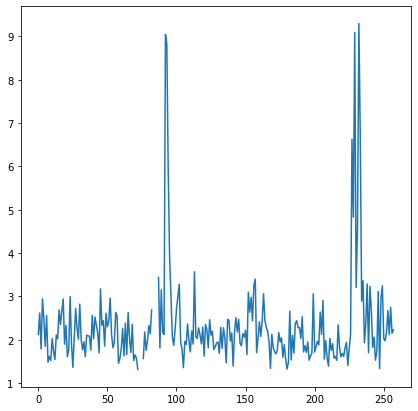

In [29]:
data =  birddata[birddata.bird_name == "Eric"]
times = data.timestamps
elapsed_time = [time-times[0] for time in times]
elapsed_days = np.array(elapsed_time)/ dt.timedelta(days=1)
next_day = 1
inds = []
daily_mean_speed = []
for (i, t) in enumerate(elapsed_days):
    if t < next_day:
        inds.append(i)
    else:
        #compute mean speed
        daily_mean_speed.append(np.mean(data.speed_2d[inds]))
        next_day += 1
        inds = []

plt.figure(figsize=(7,7))
plt.plot(daily_mean_speed)
plt.xlabel = ("Day")
plt.ylabel = ("Mean Speed(m/s)")


# Error for 4.2.3

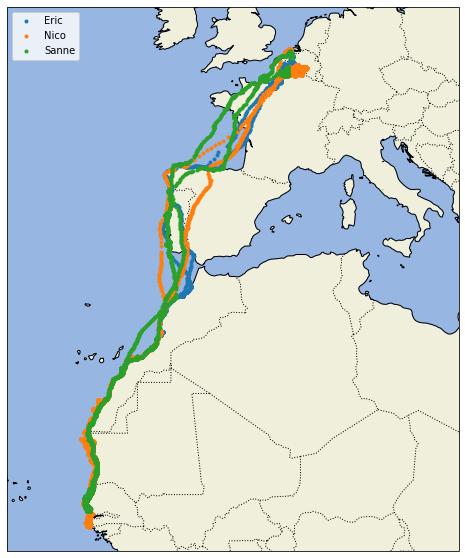

In [30]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
bird_names = pd.unique(birddata.bird_name)
  
# To move forward, we need to specify a 
# specific projection that we're interested 
# in using.
proj = ccrs.Mercator() 
  
plt.figure(figsize=(10,10))
ax = plt.axes(projection=proj)
ax.set_extent((-25.0, 20.0, 52.0, 10.0))
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
for name in bird_names:
    ix = birddata['bird_name'] == name
    x,y = birddata.longitude[ix], birddata.latitude[ix]
    ax.plot(x,y,'.', transform=ccrs.Geodetic(), label=name)
plt.legend(loc="upper left")
plt.show()